# Задание 3-4
Выполнено студенткой группы ИММО-01-25 Чан Минь Ханг

In [1]:
import requests
import re

import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import datasets

from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, RobustScaler
from sklearn.impute import SimpleImputer

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, MDS, Isomap, LocallyLinearEmbedding
from sklearn.metrics import pairwise_distances, silhouette_score
import umap
import trimap
import pacmap

import warnings
warnings.filterwarnings('ignore')

## Визуализация в двухмерном пространстве набора данных с использованием алгоритмов нелинейного снижения размерности t-sne, UMAP, TriMAP и PacMAP

Для алгоритмов t-sne, UMAP, TriMAP и PacMAP имеются программные 
реализации в Python: 
- t-sne (https://scikitlearn.org/stable/modules/generated/sklearn.manifold.TSNE.html), 
- UMAP (https://umap-learn.readthedocs.io/en/latest/), 
- TriMap (https://pypi.org/project/trimap/) 
- PaCMAP (https://pypi.org/project/pacmap/). 

Для каждого алгоритма рассмотреть не менее 6 вариантов сочетаний 
значений их параметров. 

Кроме того, рассмотреть результаты вложения набора данных в 
двухмерное пространство при значениях параметров алгоритмов, заданных по 
умолчанию. 

При работе с набором данных реализовать различные варианты 
масштабирования: 
- MinMax (https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html?highlight=minmax#sklearn.preprocessing.MinMaxScaler), 
- Standard (https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler), 
- Robust (https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.RobustScaler.html?highlight=robust#sklearn.preprocessing.RobustScaler). 

Выполнить сравнительный анализ результатов масштабирования 
(https://scikit-learn.org/stable/auto_examples/preprocessing/plot_all_scaling.html#sphx-glr-auto-examples-preprocessing-plot-all-scaling-py, 
https://www.geeksforgeeks.org/standardscaler-minmaxscaler-and-robustscaler-techniques-ml/). 

Разбиение на обучающую и тестовую выборку не проводить. 

Библиотека алгоритмов машинного обучения: 
https://scikit-learn.org/stable/.  

**Вариант №19**: https://archive.ics.uci.edu/dataset/104/university

In [2]:
# from ucimlrepo import fetch_ucirepo

# university = fetch_ucirepo(id=104)

# X = university.data.features
# y = university.data.targets

In [3]:
url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/university/university'
url_data = url + ".data"
url_names = url + ".names"

In [4]:
def parse_data(content):
    universities = []
    current_university = {}
    
    lines = content.split('\n')
    i = 0
    
    while i < len(lines):
        line = lines[i].strip().upper()
        
        # Start of a new university instance
        if line.startswith('(DEF-INSTANCE'):
            if current_university:
                universities.append(current_university)
            current_university = {}
            # Extract university name
            name_match = re.search(r'\(DEF-INSTANCE\s+([^\s]+)', line)
            if name_match:
                current_university['name'] = name_match.group(1)
        
        # Parse attributes
        elif line.startswith('(') and not line.startswith('(DEF-INSTANCE') and not line.startswith('(DEFPROP'):
            # Handle multi-line attributes
            full_line = line
            j = i + 1
            while j < len(lines) and not lines[j].strip().startswith('(') and not lines[j].strip().startswith(')'):
                full_line += ' ' + lines[j].strip()
                j += 1
            i = j - 1
            
            # Parse the attribute
            attr_match = re.search(r'\(([^\)\s]+)\s+([^\)]+)\)', full_line)
            if attr_match:
                attr_name = attr_match.group(1).lower().replace('-', '_')
                attr_value = attr_match.group(2).strip()
                
                # Handle special cases
                if attr_name == 'state':
                    current_university[attr_name] = attr_value.upper()
                elif attr_name in ['sat_verbal', 'sat_math']:
                    if 'ACT-15' in attr_value:
                        current_university[attr_name] = '850'
                    elif 'ACT-21' in attr_value:
                        current_university[attr_name] = '1080'
                    else:
                        current_university[attr_name] = attr_value
#                     # Handle N/A values and ranges
#                     if 'N/A' in attr_value or 'NA' in attr_value:
#                         current_university[attr_name] = None
#                     else:
#                         # Extract numeric value
#                         num_match = re.search(r'(\d+)', attr_value)
#                         if num_match:
#                             current_university[attr_name] = int(num_match.group(1))
#                         else:
#                             current_university[attr_name] = None
                elif attr_name == 'no_of_students':
                    # Parse student count ranges
                    if 'THOUS:5-' in attr_value:
                        current_university[attr_name] = '0-5000'
                    elif 'THOUS:5-10' in attr_value:
                        current_university[attr_name] = '5000-10000'
                    elif 'THOUS:10-15' in attr_value:
                        current_university[attr_name] = '10000-15000'
                    elif 'THOUS:15-20' in attr_value:
                        current_university[attr_name] = '15000-20000'
                    elif 'THOUS:20+' in attr_value:
                        current_university[attr_name] = '20000+'
                    else:
                        current_university[attr_name] = attr_value
                elif attr_name == 'expenses':
                    # Parse expense ranges
                    if 'THOUS$:4-' in attr_value:
                        current_university[attr_name] = '0-4000'
                    elif 'THOUS$:4-7' in attr_value:
                        current_university[attr_name] = '4000-7000'
                    elif 'THOUS$:7-10' in attr_value:
                        current_university[attr_name] = '7000-10000'
                    elif 'THOUS$:10+' in attr_value:
                        current_university[attr_name] = '10000+'
                    else:
                        current_university[attr_name] = attr_value
#                 elif attr_name in ['percent_financial_aid', 'percent_admittance', 'percent_enrolled']:
#                     # Parse percentages
#                     num_match = re.search(r'(\d+)', attr_value)
#                     if num_match:
#                         current_university[attr_name] = int(num_match.group(1))
#                     else:
#                         current_university[attr_name] = None
                elif attr_name == 'academic_emphasis':
#                     Handle multiple academic emphasis entries
                    if 'academic_emphasis' not in current_university:
                        current_university['academic_emphasis'] = []
                    emphasis = attr_value.replace(':', '-').replace('_', '-').lower()
                    current_university['academic_emphasis'].append(emphasis)
                elif attr_name == 'no_applicants':
                    # Parse applicant ranges
                    if 'THOUS:4-' in attr_value:
                        current_university[attr_name] = '0-4000'
                    elif 'THOUS:4-7' in attr_value:
                        current_university[attr_name] = '4000-7000'
                    elif 'THOUS:7-10' in attr_value:
                        current_university[attr_name] = '7000-10000'
                    elif 'THOUS:10-13' in attr_value:
                        current_university[attr_name] = '10000-13000'
                    elif 'THOUS:13-17' in attr_value:
                        current_university[attr_name] = '13000-17000'
                    elif 'THOUS:17+' in attr_value:
                        current_university[attr_name] = '17000+'
                    else:
                        current_university[attr_name] = attr_value
                else:
                    current_university[attr_name] = attr_value
        
        i += 1
    
    # Add the last university
    if current_university:
        universities.append(current_university)
    
    return universities

In [5]:
with open('university.txt', 'r') as file:
    content = file.read()

universities_data = parse_data(content)
df = pd.DataFrame(universities_data)

df['academic_emphasis'] = df['academic_emphasis'].apply(lambda x: ', '.join(x) 
                                                        if isinstance(x, list) else x)

df.to_csv('university.csv', index=False)

df

,name,state,control,no_of_students,male:female_ratio,student:faculty_ratio,sat_verbal,sat_math,expenses,percent_financial_aid,...,percent_admittance,percent_enrolled,academics_scale,social_scale,quality_of_life_scale,academic_emphasis,location,colors,mascot,religious_backing
0,ADELPHI,NEWYORK,PRIVATE,0-5000,30:70,15:1,500,475,7000-10000,60,...,70,40,2,2,2,"business-administration, biology",NaN,NaN,NaN,NaN
1,ARIZONA-STATE,ARIZONA,STATE,20000+,50:50,20:1,450,500,0-4000,50,...,80,60,3,4,5,"business-education, engineering, accounting, f...",NaN,NaN,NaN,NaN
2,BOSTON-COLLEGE,MASSACHUSETTS,PRIVATE:ROMAN-CATHOLIC,0-5000,40:60,20:1,500,550,10000+,60,...,50,40,4,5,3,"economics, biology, english",SUBURBAN,NaN,NaN,NaN
3,BOSTON-UNIVERSITY,MASSACHUSETTS,PRIVATE,10000-15000,45:55,12:1,550,575,10000+,60,...,60,40,4,4,3,"business-administration, psychology, liberal-arts",URBAN,NaN,NaN,NaN
4,BROWN,RHODEISLAND,PRIVATE,0-5000,50:50,11:1,625,650,10000+,40,...,20,50,5,4,5,"biology, history, arts-sciences",URBAN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
280,ORAL-ROBERTS-UNIVERSITY,OKLAHOMA,PRIVATE,0-5000,1:1,11:1,463,490,0-4000,70,...,65,75,4,2,3,"business-administration, education, fine-and-p...",SUBURBAN,NaN,NaN,NaN
281,UNIVERSITY-OF-TULSA,OKLAHOMA,PRIVATE,0-5000,3:2,16:1,471,520,0-4000,75,...,85,65,4,4,4,"area-studies, business-administration, educati...",URBAN,NaN,NaN,NaN
282,CONNECTICUT-COLLEGE,CONNECTICUT,PRIVATE,0-5000,35:65,10:1,550,575,10000+,30,...,40,40,4,3,4,liberal-arts,SMALL-CITY,NaN,NaN,NaN
283,LEHIGH-UNIVERSITY,PENNSYLVANIA,PRIVATE,0-5000,75:25,10:1,550,650,7000-10000,45,...,50,40,4,4,2,"engineering, physical",SMALL-CITY,NaN,NaN,NaN


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 285 entries, 0 to 284
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   name                   285 non-null    object
 1   state                  285 non-null    object
 2   control                282 non-null    object
 3   no_of_students         285 non-null    object
 4   male:female_ratio      285 non-null    object
 5   student:faculty_ratio  263 non-null    object
 6   sat_verbal             263 non-null    object
 7   sat_math               263 non-null    object
 8   expenses               285 non-null    object
 9   percent_financial_aid  273 non-null    object
 10  no_applicants          279 non-null    object
 11  percent_admittance     280 non-null    object
 12  percent_enrolled       281 non-null    object
 13  academics_scale        277 non-null    object
 14  social_scale           277 non-null    object
 15  quality_of_life_scale  

In [7]:
def process_range(value):
    if pd.isna(value):
        return np.nan
    value_str = str(value)
    if '-' in value_str:
        try:
            parts = value_str.split('-')
            return np.mean([float(part) for part in parts])
        except:
            return np.nan
    else:
        try:
            return float(value_str)
        except:
            return np.nan

def process_ratio(value):
    if pd.isna(value):
        return np.nan
    value_str = str(value)
    if ':' in value_str:
        try:
            parts = value_str.split(':')
            if len(parts) == 2 and float(parts[1]) != 0:
                return float(parts[0]) / float(parts[1])
            else:
                return np.nan
        except:
            return np.nan
    else:
        try:
            return float(value_str)
        except:
            return np.nan
        
df_processed = df.copy()

if 'no_of_students' in df_processed.columns:
    df_processed['no_of_students'] = df_processed['no_of_students'].apply(process_range)

if 'expenses' in df_processed.columns:
    df_processed['expenses'] = df_processed['expenses'].apply(process_range)

if 'no_applicants' in df_processed.columns:
    df_processed['no_applicants'] = df_processed['no_applicants'].apply(process_range)

if 'male:female_ratio' in df_processed.columns:
    df_processed['male_ratio'] = df_processed['male:female_ratio'].apply(
        lambda x: float(str(x).split(':')[0])/sum([float(i) for i in str(x).split(':')]) 
        if ':' in str(x) and sum([float(i) for i in str(x).split(':')]) != 0 else np.nan
    )

if 'student:faculty_ratio' in df_processed.columns:
    df_processed['student_faculty_ratio'] = df_processed['student:faculty_ratio'].apply(process_ratio)

final_numeric_cols = []
potential_cols = [
    'no_of_students', 'sat_verbal', 'sat_math', 'expenses', 
    'percent_financial_aid', 'no_applicants', 'percent_admittance', 
    'percent_enrolled', 'academics_scale', 'social_scale', 
    'quality_of_life_scale', 'male_ratio', 'student_faculty_ratio'
]

for col in potential_cols:
    if col in df_processed.columns:
        final_numeric_cols.append(col)

df_processed = df_processed[final_numeric_cols]

imputer = SimpleImputer(strategy='median')
df_processed = pd.DataFrame(
    imputer.fit_transform(df_processed),
    columns=df_processed.columns,
    index=df_processed.index
)

df_processed.to_csv('university_processed.csv', index=False)

df_processed

,no_of_students,sat_verbal,sat_math,expenses,percent_financial_aid,no_applicants,percent_admittance,percent_enrolled,academics_scale,social_scale,quality_of_life_scale,male_ratio,student_faculty_ratio
0,2500.0,500.0,475.0,8500.0,60.0,2000.0,70.0,40.0,2.0,2.0,2.0,0.300000,15.0
1,2500.0,450.0,500.0,2000.0,50.0,2000.0,80.0,60.0,3.0,4.0,5.0,0.500000,20.0
2,2500.0,500.0,550.0,2000.0,60.0,11500.0,50.0,40.0,4.0,5.0,3.0,0.400000,20.0
3,12500.0,550.0,575.0,2000.0,60.0,15000.0,60.0,40.0,4.0,4.0,3.0,0.450000,12.0
4,2500.0,625.0,650.0,2000.0,40.0,11500.0,20.0,50.0,5.0,4.0,5.0,0.500000,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
280,2500.0,463.0,490.0,2000.0,70.0,2000.0,65.0,75.0,4.0,2.0,3.0,0.500000,11.0
281,2500.0,471.0,520.0,2000.0,75.0,2000.0,85.0,65.0,4.0,4.0,4.0,0.600000,16.0
282,2500.0,550.0,575.0,2000.0,30.0,2000.0,40.0,40.0,4.0,3.0,4.0,0.350000,10.0
283,2500.0,550.0,650.0,8500.0,45.0,2000.0,50.0,40.0,4.0,4.0,2.0,0.750000,10.0


In [8]:
scalers = {
    'MinMax': MinMaxScaler(),
    'Standard': StandardScaler(),
    'Robust': RobustScaler()
}

algorithms = {
    't-SNE': {
        'default': {},
        'params_sets': [
            {"perplexity": 5, "learning_rate": 50},
            {"perplexity": 30, "learning_rate": 200},
            {"perplexity": 50, "learning_rate": 1000},
            {"perplexity": 10, "learning_rate": 10},
            {"perplexity": 40, "learning_rate": 500},
            {"perplexity": 20, "learning_rate": 200}
        ]
    },
    'UMAP': {
        'default': {},
        'params_sets': [
            {"n_neighbors": 5, "min_dist": 0.1},
            {"n_neighbors": 15, "min_dist": 0.01},
            {"n_neighbors": 50, "min_dist": 0.5},
            {"n_neighbors": 10, "min_dist": 0.2},
            {"n_neighbors": 30, "min_dist": 0.05},
            {'n_neighbors': 50, 'min_dist': 0.8}
        ]
    },
    'TriMAP': {
        'default': {},
        'params_sets': [
            {"n_inliers": 10, "n_outliers": 5, "n_random": 5},
            {"n_inliers": 20, "n_outliers": 10, "n_random": 5},
            {"n_inliers": 30, "n_outliers": 10, "n_random": 10},
            {"n_inliers": 15, "n_outliers": 5, "n_random": 10},
            {"n_inliers": 25, "n_outliers": 10, "n_random": 15},
            {'n_inliers': 30, 'n_outliers': 10, 'n_iters': 800}
        ]
    },
    'PaCMAP': {
        'default': {},
        'params_sets': [
            {"n_neighbors": 5, "MN_ratio": 0.5, "FP_ratio": 2.0},
            {"n_neighbors": 10, "MN_ratio": 0.5, "FP_ratio": 2.0},
            {"n_neighbors": 15, "MN_ratio": 0.7, "FP_ratio": 2.5},
            {"n_neighbors": 20, "MN_ratio": 0.3, "FP_ratio": 1.5},
            {"n_neighbors": 30, "MN_ratio": 0.8, "FP_ratio": 3.0},
            {'n_neighbors': 30, 'MN_ratio': 0.9, 'FP_ratio': 10.0}
        ]
    }
}

In [9]:
def process_algorithms(data):
    results = {}

    for scaler_name, scaler in scalers.items():
        print(f"\nМАСШТАБИРОВАНИЕ: {scaler_name}")
        X_scaled = scaler.fit_transform(data)
        results[scaler_name] = {}

        for method_name, config in algorithms.items():
            print(f"\tАлгоритм: {method_name}")
            results[scaler_name][method_name] = {}

            all_params = [('default', config['default'])] + \
                        [(f'params_{i+1}', params_set) 
                         for i, params_set in enumerate(config['params_sets'])]

            for param_name, params in all_params:
                print(f"\t\t{param_name}:", end=" ")
                
                try:
                    if method_name == 't-SNE':
                        reducer = TSNE(n_components=2, 
                                       random_state=42, **params)
                        embedding = reducer.fit_transform(X_scaled)
                    elif method_name == 'UMAP':
                        reducer = umap.UMAP(n_components=2, 
                                            random_state=42, **params)
                        embedding = reducer.fit_transform(X_scaled)
                    elif method_name == 'TriMAP':
                        reducer = trimap.TRIMAP(n_dims=2, **params)
                        embedding = reducer.fit_transform(X_scaled)
                    elif method_name == 'PaCMAP':
                        reducer = pacmap.PaCMAP(n_components=2, 
                                                random_state=42, **params)
                        embedding = reducer.fit_transform(X_scaled)
                    else:
                        embedding = None
                    
                    if embedding is not None:
                        valid_indices = np.arange(len(embedding))
                        valid_data = data.iloc[valid_indices].copy()

                        results[scaler_name][method_name][param_name] = {
                            'embedding': embedding,
                            'valid_data': valid_data,
                            'valid_indices': valid_indices,
                            'params_set': params
                        }
                
                        if len(embedding) != len(X_scaled):
                            print(f"⚠️  РАЗМЕРЫ: {len(X_scaled)} → {len(embedding)}")
                        else:
                            print("✓ Успешно")

                    else:
                        print("✗ Ошибка")
                    
                except Exception as e:
                    print(f"✗ Ошибка: {e}")
                                
    return results

In [10]:
university_results = process_algorithms(df_processed)


МАСШТАБИРОВАНИЕ: MinMax
	Алгоритм: t-SNE
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: ✓ Успешно
	Алгоритм: UMAP
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: ✓ Успешно
	Алгоритм: TriMAP
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: 

✓ Успешно
	Алгоритм: PaCMAP
		default: 

✓ Успешно
		params_1: 

✓ Успешно
		params_2: 

✓ Успешно
		params_3: 

✓ Успешно
		params_4: 

✓ Успешно
		params_5: 

Sample size cannot accommodate number of further pairs requested. n_FP will be reduced.


✓ Успешно
		params_6: ✓ Успешно

МАСШТАБИРОВАНИЕ: Standard
	Алгоритм: t-SNE
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: ✓ Успешно
	Алгоритм: UMAP
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: ✓ Успешно
	Алгоритм: TriMAP
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: 

✓ Успешно
	Алгоритм: PaCMAP
		default: 

✓ Успешно
		params_1: 

✓ Успешно
		params_2: ✓ Успешно
		params_3: 

✓ Успешно
		params_4: 

✓ Успешно
		params_5: 

Sample size cannot accommodate number of further pairs requested. n_FP will be reduced.


✓ Успешно
		params_6: ✓ Успешно

МАСШТАБИРОВАНИЕ: Robust
	Алгоритм: t-SNE
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: ✓ Успешно
	Алгоритм: UMAP
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: ✓ Успешно
	Алгоритм: TriMAP
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: 

✓ Успешно
	Алгоритм: PaCMAP
		default: 

✓ Успешно
		params_1: 

✓ Успешно
		params_2: 

✓ Успешно
		params_3: 

✓ Успешно
		params_4: 

✓ Успешно
		params_5: 

Sample size cannot accommodate number of further pairs requested. n_FP will be reduced.


✓ Успешно
		params_6: ✓ Успешно


In [11]:
def scattering (ax, result_data, color_data, title, 
                cmap='viridis', show_colorbar=False):
    embedding = result_data['embedding']
    valid_data = result_data['valid_data']
    
    scatter = ax.scatter(embedding[:, 0], embedding[:, 1], 
                         c=valid_data[color_data['name']], cmap=cmap, 
                         alpha=0.7, s=20, edgecolor='white', linewidth=0.2)
    
    ax.set_title(title)
    ax.set_xlabel('Component 1')
    ax.set_ylabel('Component 2')
    ax.grid(alpha=0.2)
    
    if show_colorbar:
        plt.colorbar(scatter, ax=ax, label=color_data['label'])
        
def visualize_all(results_dict, color_data):
    for scaler_name in scalers.keys():
        for method_name in algorithms.keys():
            if (scaler_name not in results_dict or 
                method_name not in results_dict[scaler_name] or
                not results_dict[scaler_name][method_name]):
                return

            method_results = results_dict[scaler_name][method_name]
            n_plots = len(method_results)

            if n_plots == 0:
                return

            n_cols = 4
            n_rows = (n_plots + n_cols - 1) // n_cols

            fig, axes = plt.subplots(n_rows, n_cols, 
                                     figsize=(5 * n_cols, 5 * n_rows))
            if n_plots == 1:
                axes = np.array([axes])
            axes = axes.flatten()

            for idx, (param_name, result_data) in enumerate(method_results.items()):
                if idx >= len(axes):
                    break

                if param_name == 'default':
                    param_title = 'Default'
                else:
                    param_title = '\n'.join([f"{key} = {value}" 
                                             for key, value in result_data['params_set'].items()])
                
                scattering(axes[idx if (idx < n_cols) 
                                else (idx + math.floor((idx + 1)/(n_cols)))],
                           result_data, color_data, title=param_title,
                           show_colorbar=True if idx==0 else False)

                if idx > 0 and idx % n_cols == 0:
                    axes[idx].set_visible(False)

            plt.suptitle(f'{method_name} с {scaler_name} масштабированием', 
                         fontsize=16, fontweight='bold', y=1.02)
            plt.tight_layout()
            plt.show()

In [12]:
university_color = {
    'name': 'academics_scale',
    'label': 'Academic Scale'
}

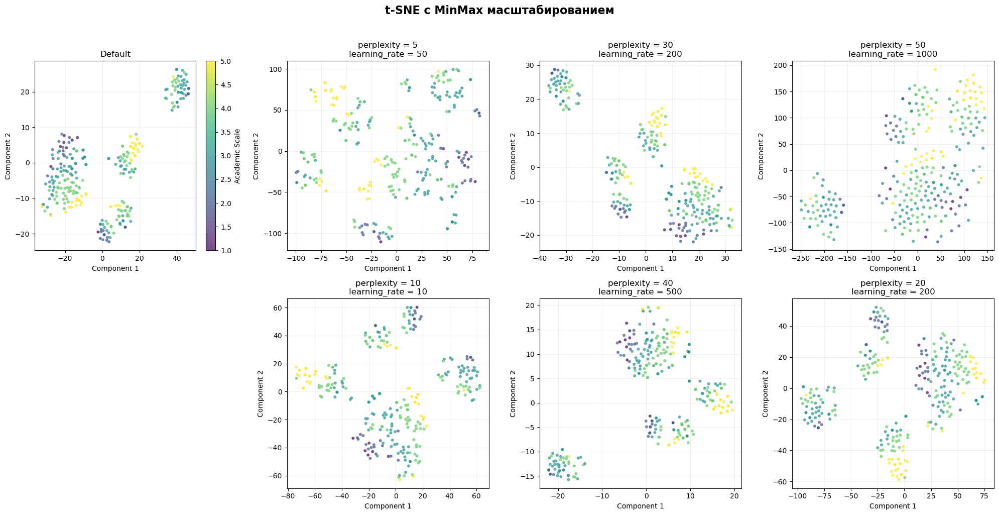

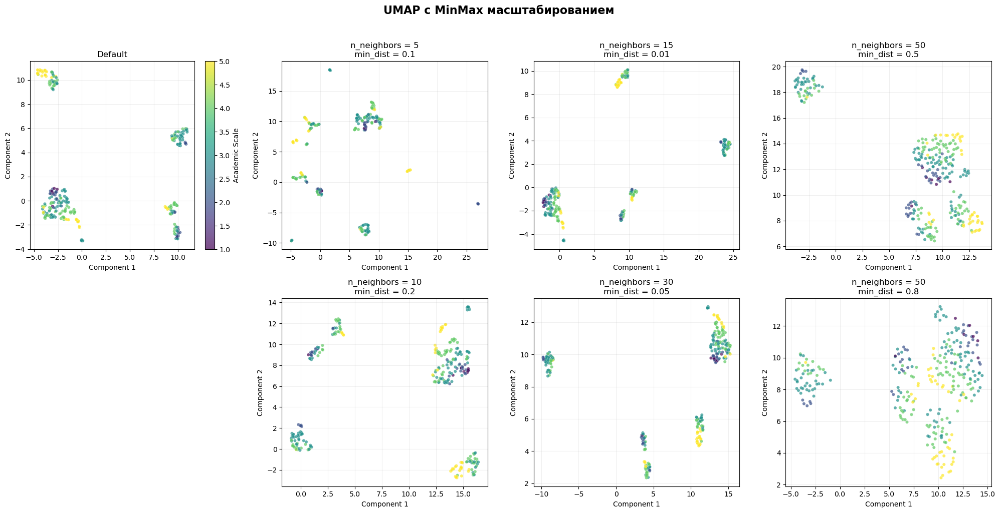

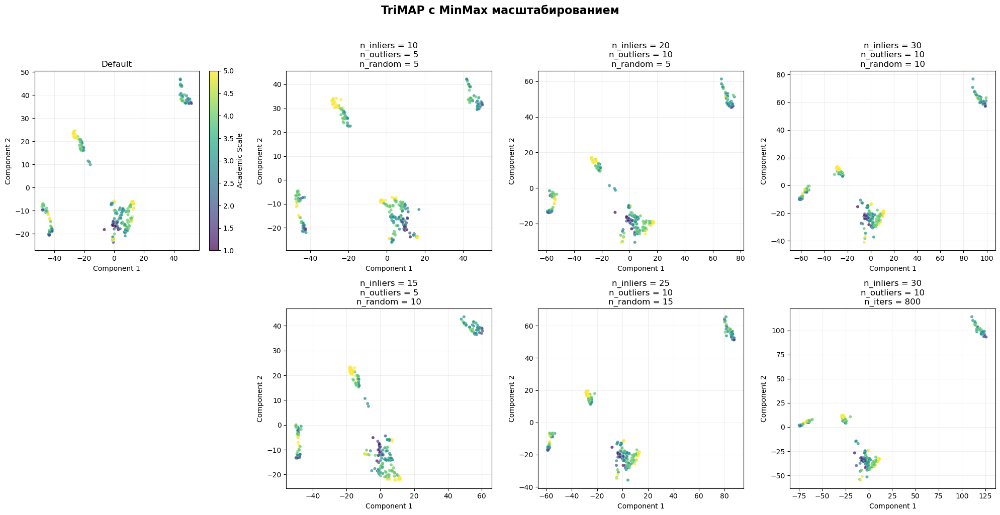

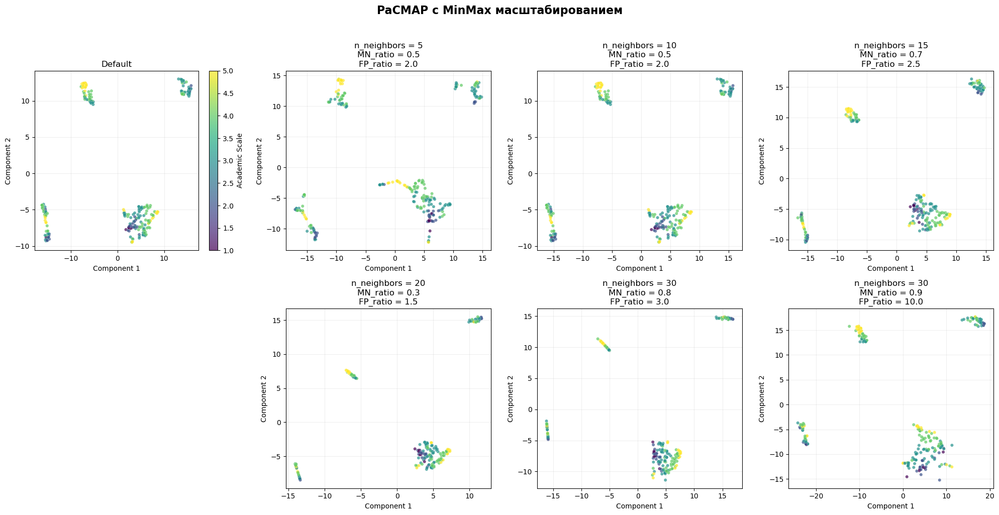

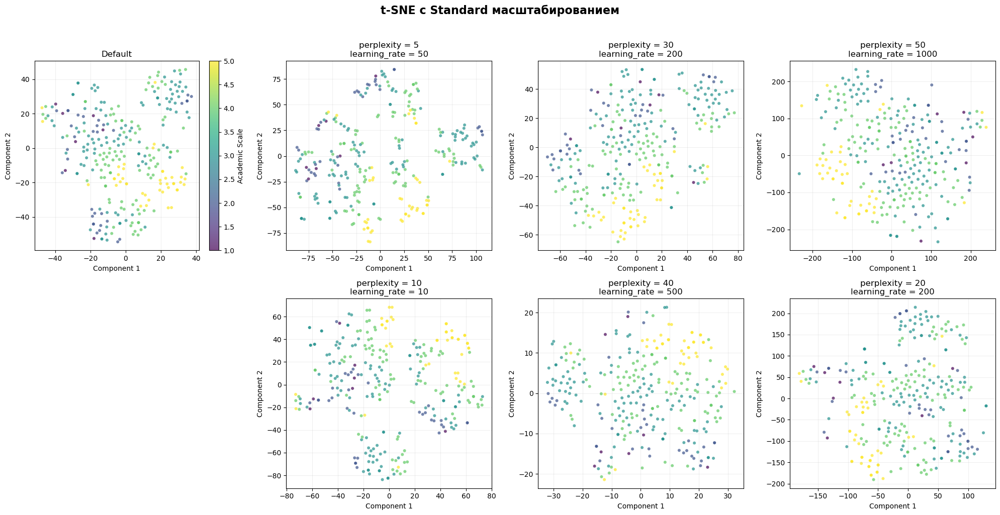

...

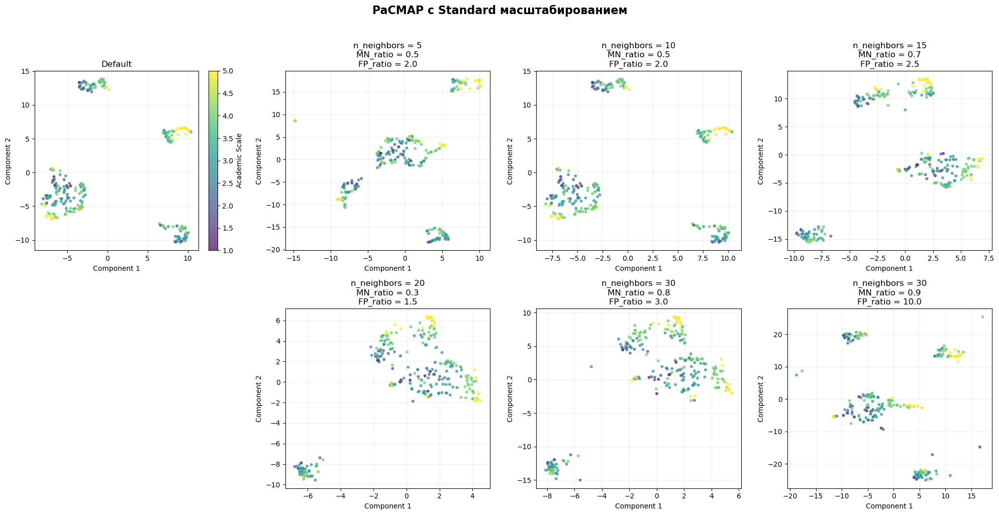

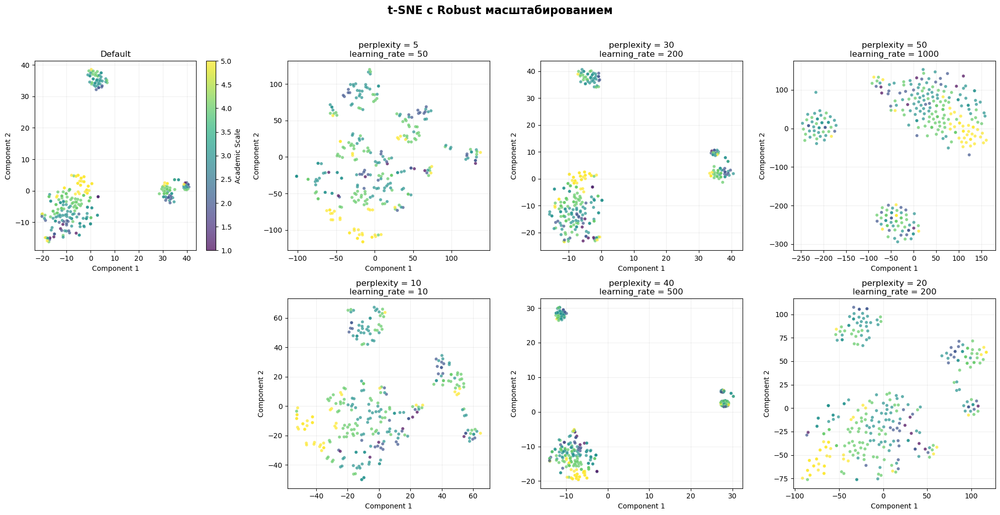

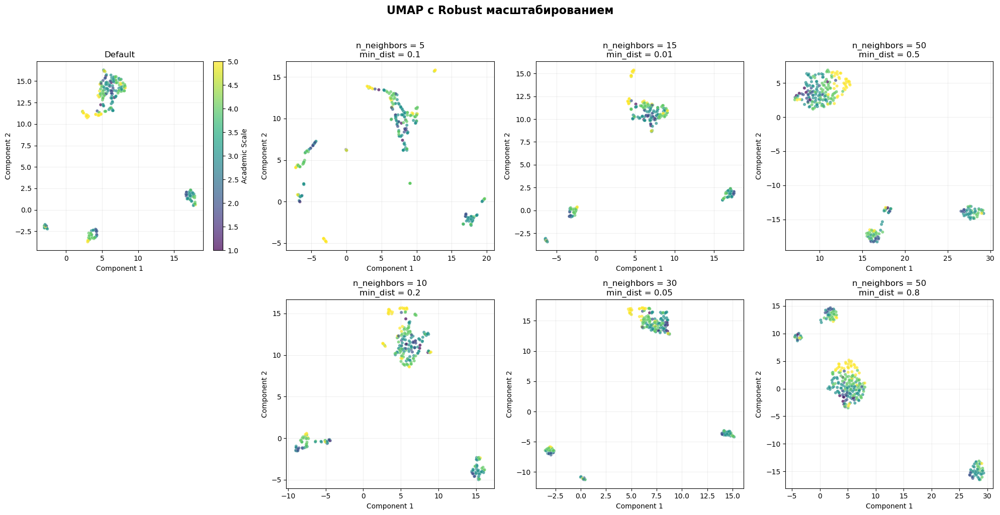

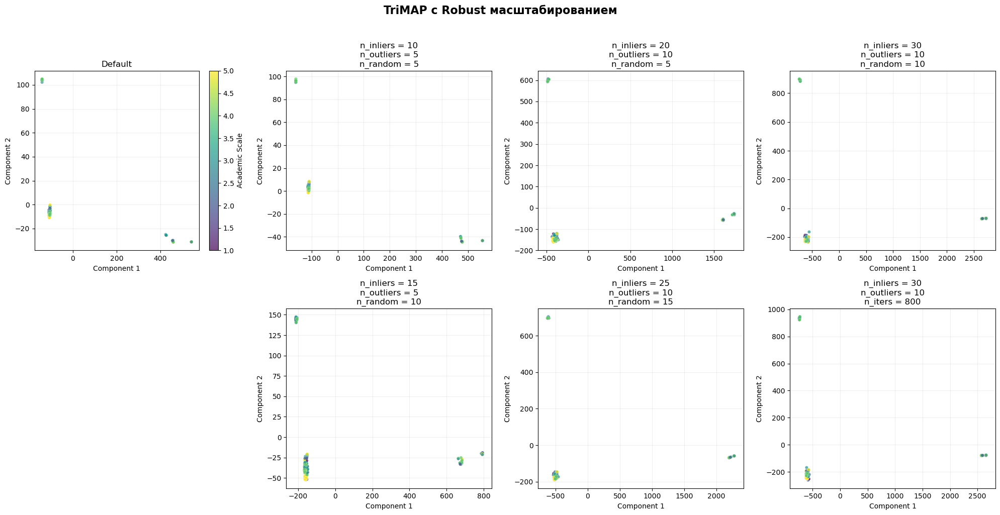

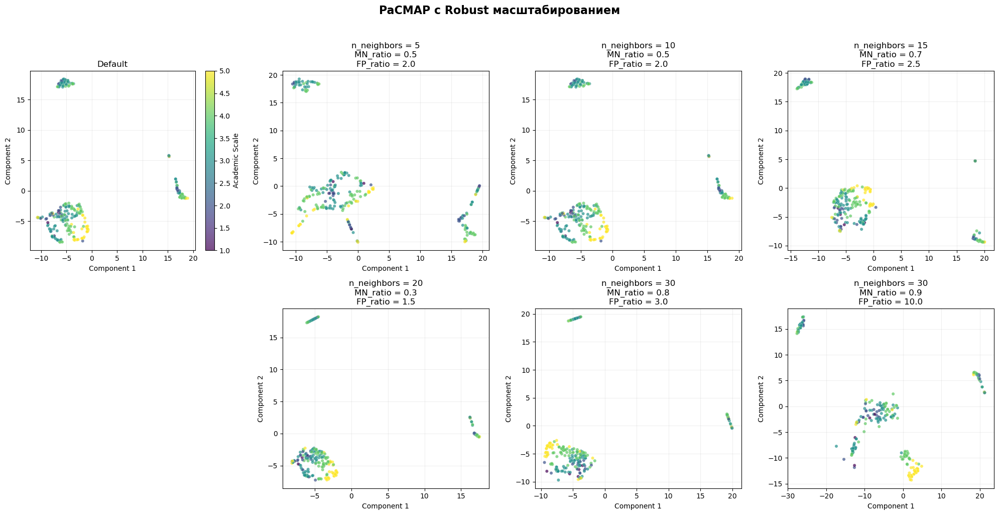

In [13]:
visualize_all(university_results, university_color)

In [20]:
def analyze_results(results_dict, original_data_df):
    results_list = []
    
    for scaler_name in scalers.keys():
        if scaler_name not in results_dict:
            continue
            
        for method_name in algorithms.keys():
            if method_name not in results_dict[scaler_name]:
                continue
                
            method_results = results_dict[scaler_name][method_name]
            
            for param_name, result_data in method_results.items():
                try:
                    embedding = result_data['embedding']
                    valid_indices = result_data['valid_indices']
                    
                    if len(embedding) < 2:
                        continue
                    
                    # Проверяем индексы
                    if len(valid_indices) == 0:
                        continue
                    
                    # Проверяем, что индексы не выходят за пределы
                    max_idx = len(original_data_df) - 1
                    if max(valid_indices) > max_idx:
                        valid_indices = [idx for idx in valid_indices 
                                         if idx <= max_idx]
                        if len(valid_indices) == 0:
                            continue
                    
                    # Безопасно получаем исходные данные
                    try:
                        original_data = original_data_df.iloc[valid_indices].values
                    except Exception as e:
                        print(f"✗ Ошибка при получении исходных данных: {e}")
                        continue
                    
                    # Проверяем размерности
                    if len(original_data) != len(embedding):
                        # Используем минимальную длину
                        min_len = min(len(original_data), len(embedding))
                        original_data = original_data[:min_len]
                        embedding = embedding[:min_len]
                    
                    if len(embedding) < 2:
                        continue
                    
                    # 1. Сохранение структуры (метрики расстояний)
                    try:
                        original_dist = pairwise_distances(original_data)
                        embedded_dist = pairwise_distances(embedding)
                        
                        # Убираем нули на диагонали
                        mask = (original_dist > 0) & (embedded_dist > 0)
                        original_dist_flat = original_dist[mask]
                        embedded_dist_flat = embedded_dist[mask]
                        
                        if len(original_dist_flat) < 2:
                            corr_coef = 0
                            stress = np.nan
                        else:
                            # Корреляция расстояний (Pearson)
                            try:
                                corr_coef = np.corrcoef(original_dist_flat, 
                                                        embedded_dist_flat)[0, 1]
                                if np.isnan(corr_coef):
                                    corr_coef = 0
                            except:
                                corr_coef = 0
                            
                            # Stress метрика (нормированное MDS stress)
                            try:
                                stress = np.sqrt(np.sum((original_dist_flat - 
                                                         embedded_dist_flat)**2) / 
                                                np.sum(original_dist_flat**2))
                            except:
                                stress = np.nan
                    except Exception as e:
                        print(f"✗ Ошибка в метриках расстояний: {e}")
                        corr_coef = 0
                        stress = np.nan
                    
                    # 2. Метрики качества кластеризации (если есть метки)
                    silhouette = np.nan
                    try:
                        # Проверяем, есть ли у нас исходные данные с метками
                        if hasattr(result_data, 'valid_data') and result_data['valid_data'] is not None:
                            valid_data = result_data['valid_data']
                            if 'academics_scale' in valid_data.columns:
                                labels = valid_data['academics_scale'].values[:len(embedding)]
                                if len(np.unique(labels)) > 1:
                                    silhouette = silhouette_score(embedding, labels)
                    except:
                        silhouette = np.nan
                    
                    # 3. Метрики распределения в 2D
                    try:
                        variance = np.var(embedding, axis=0).sum()
                    except:
                        variance = np.nan
                    
                    try:
                        data_range = np.max(embedding) - np.min(embedding)
                    except:
                        data_range = np.nan
                    
                    # 4. Метрика сохранения ближайших соседей
                    neighbor_overlap = np.nan
                    try:
                        if len(embedding) > 10:
                            # Берем 10 ближайших соседей или 10% от данных
                            n_neighbors = min(10, len(embedding) // 10)
                            if n_neighbors < 2:
                                n_neighbors = 2
                            
                            # Находим ближайших соседей в исходном пространстве
                            from sklearn.neighbors import NearestNeighbors
                            nn_orig = NearestNeighbors(n_neighbors=n_neighbors+1).fit(original_data)
                            orig_neighbors = nn_orig.kneighbors(return_distance=False)
                            
                            # Находим ближайших соседей в 2D пространстве
                            nn_embed = NearestNeighbors(n_neighbors=n_neighbors+1).fit(embedding)
                            embed_neighbors = nn_embed.kneighbors(return_distance=False)
                            
                            # Вычисляем overlap (сколько общих соседей)
                            overlap_scores = []
                            for i in range(len(embedding)):
                                # Исключаем саму точку (первый сосед)
                                orig_set = set(orig_neighbors[i][1:])
                                embed_set = set(embed_neighbors[i][1:])
                                overlap = len(orig_set.intersection(embed_set)) / n_neighbors
                                overlap_scores.append(overlap)
                            
                            neighbor_overlap = np.mean(overlap_scores)
                    except Exception as e:
                        neighbor_overlap = np.nan
                    
                    # 5. Дополнительная метрика: trustworthiness
                    trustworthiness = np.nan
                    try:
                        if len(embedding) > 10:
                            from sklearn.manifold import trustworthiness
                            # Берем разумное количество соседей
                            n_neighbors_tw = min(15, len(embedding) - 1)
                            if n_neighbors_tw >= 2:
                                trustworthiness = trustworthiness(
                                    original_data, embedding, 
                                    n_neighbors=n_neighbors_tw
                                )
                    except:
                        trustworthiness = np.nan
                    
                    # Сохраняем результаты
                    results_list.append({
                        'Алгоритм': method_name,
                        'Масштабирование': scaler_name,
                        'Параметры': param_name,
                        'Корреляция расстояний': corr_coef,
                        'Stress метрика': stress,
                        'Silhouette Score': silhouette,
                        'Сохранение соседей': neighbor_overlap,
                        'Trustworthiness': trustworthiness,
                        'Общая дисперсия': variance,
                        'Разброс данных': data_range,
                        'Количество точек': len(embedding),
                        'Параметры_значения': str(result_data.get('params_set', {}))
                    })
                    
                except Exception as e:
                    print(f"✗ Ошибка: {e}")
                    import traceback
                    traceback.print_exc()
                    continue
    
    # Создаем DataFrame
    if not results_list:
        return
    
    results_df = pd.DataFrame(results_list)

    analysis_df = results_df.copy()
    analysis_df = analysis_df[analysis_df['Корреляция расстояний'].notna()]
    analysis_df = analysis_df[analysis_df['Количество точек'] > 1]
    
    if analysis_df.empty:
        print("Нет корректных данных для визуализации")
        return
    
    print(f"\nТОП-10 КОМБИНАЦИЙ ПО КОРРЕЛЯЦИИ РАССТОЯНИЙ")
    top10_corr = analysis_df.nlargest(10, 'Корреляция расстояний')[['Алгоритм', 'Масштабирование', 'Параметры', 
                                                                     'Корреляция расстояний', 'Stress метрика', 
                                                                     'Количество точек']]
    print(top10_corr.to_string(index=False, 
                               float_format=lambda x: f'{x:.4f}' 
                               if isinstance(x, float) else x))
    
    if 'Сохранение соседей' in analysis_df.columns and analysis_df['Сохранение соседей'].notna().any():
        print(f"\nТОП-10 КОМБИНАЦИЙ ПО СОХРАНЕНИЮ СОСЕДЕЙ")
        top10_neighbors = analysis_df.nlargest(10, 'Сохранение соседей')[['Алгоритм', 'Масштабирование', 'Параметры', 
                                                                          'Сохранение соседей', 'Корреляция расстояний']]
        print(top10_neighbors.to_string(index=False, 
                                        float_format=lambda x: f'{x:.4f}' 
                                        if isinstance(x, float) else x))
    
    print(f"\nЛУЧШАЯ КОМБИНАЦИЯ ДЛЯ КАЖДОГО АЛГОРИТМА")
    best_by_algo = []
    for algo in analysis_df['Алгоритм'].unique():
        algo_df = analysis_df[analysis_df['Алгоритм'] == algo]
        if not algo_df.empty:
            best_idx = algo_df['Корреляция расстояний'].idxmax()
            best_row = algo_df.loc[best_idx]
            best_by_algo.append({
                'Алгоритм': algo,
                'Масштабирование': best_row['Масштабирование'],
                'Параметры': best_row['Параметры'],
                'Корреляция': best_row['Корреляция расстояний'],
                'Stress': best_row['Stress метрика'],
                'Точки': best_row['Количество точек']
            })
    
    best_df = pd.DataFrame(best_by_algo)
    best_df = best_df.sort_values('Корреляция', ascending=False)
    print(best_df.to_string(index=False, 
                            float_format=lambda x: f'{x:.4f}' 
                            if isinstance(x, float) else x))

In [21]:
university_stats = analyze_results(university_results, df_processed)


ТОП-10 КОМБИНАЦИЙ ПО КОРРЕЛЯЦИИ РАССТОЯНИЙ
Алгоритм Масштабирование Параметры  Корреляция расстояний  Stress метрика  Количество точек
  PaCMAP          MinMax   default                 0.7675          0.9982               285
  PaCMAP          MinMax  params_2                 0.7675          0.9982               285
  PaCMAP          MinMax  params_3                 0.7505          0.9982               285
  PaCMAP          MinMax  params_6                 0.7417          0.9976               285
    UMAP          Robust  params_2                 0.7414          0.9989               285
  TriMAP          Robust  params_2                 0.7398          0.8929               285
  PaCMAP          MinMax  params_1                 0.7385          0.9982               285
  PaCMAP          MinMax  params_4                 0.7363          0.9984               285
  TriMAP          Robust  params_4                 0.7340          0.9561               285
  TriMAP          Robust  params_6  

## Вложение трехмерного объекта в двухмерное пространство

Применить к набору данных mammoth.csv, описывающего трехмерный объект, при разных сочетаниях значений их параметров. Для каждого алгоритма рассмотреть не менее 6 вариантов сочетаний значений их параметров. Использовать различные варианты масштабирования данных. 

Кроме того, рассмотреть результаты вложения трехмерного объекта в двухмерное пространство при значениях параметров алгоритмов, заданных по умолчанию.

In [22]:
mammoth_data = pd.read_csv('mammoth.csv')
mammoth_data

,x,y,z
0,58.823,228.407,79.843
1,59.197,228.642,77.478
2,58.734,228.931,78.515
3,59.043,228.693,78.571
4,59.223,228.667,78.611
...,...,...,...
999773,45.775,313.390,117.697
999774,54.707,323.795,-80.527
999775,53.756,324.630,-83.203
999776,49.131,319.816,-26.200


In [23]:
mammoth_data.describe()

,x,y,z
count,999778.000000,999778.000000,999778.000000
mean,76.640520,353.807856,45.878165
std,33.858831,105.516480,89.852235
min,-22.533000,60.952000,-172.225000
25%,50.896000,289.240000,15.191250
50%,76.649000,335.656000,80.701000
75%,102.445000,435.566000,112.860000
max,169.603000,568.916000,172.238000


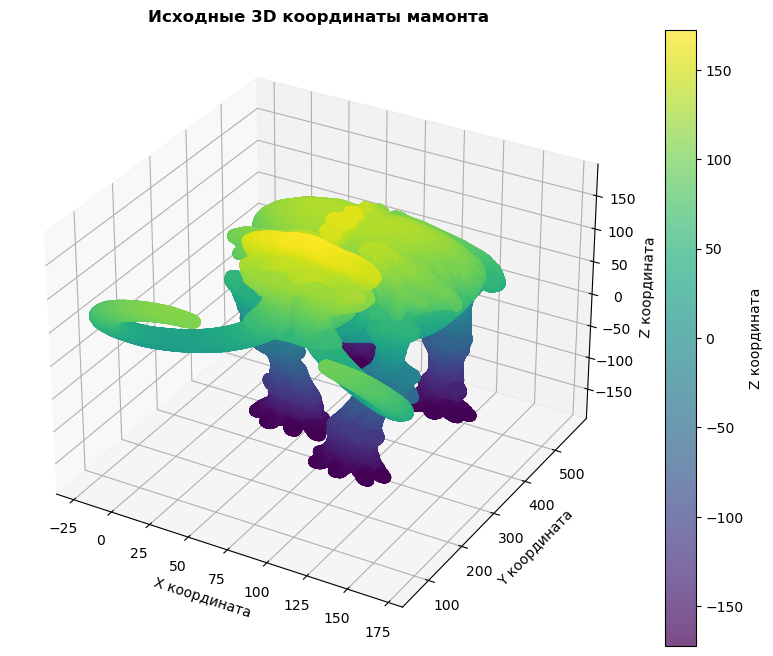

In [25]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(mammoth_data['x'], mammoth_data['y'], mammoth_data['z'],
                     c=mammoth_data['z'], cmap='viridis', alpha=0.7, s=50)

ax.set_xlabel('X координата')
ax.set_ylabel('Y координата')
ax.set_zlabel('Z координата')
ax.set_title("Исходные 3D координаты мамонта", fontweight='bold')
plt.colorbar(scatter, ax=ax, label='Z координата')
plt.show()

In [27]:
mammoth_sample = mammoth_data.sample(n=10000, random_state=42).copy()
mammoth_sample

,x,y,z
545884,53.441,329.536,108.807
359208,80.453,336.454,104.619
295799,72.278,506.154,80.135
357636,77.343,290.973,120.397
598471,91.655,216.630,87.732
...,...,...,...
272447,84.323,391.068,125.959
795799,99.715,234.840,83.505
712006,97.806,467.228,-168.295
200735,107.188,345.710,114.953


In [28]:
mammoth_results = process_algorithms(mammoth_sample)


МАСШТАБИРОВАНИЕ: MinMax
	Алгоритм: t-SNE
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: ✓ Успешно
	Алгоритм: UMAP
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: ✓ Успешно
	Алгоритм: TriMAP
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: 

✓ Успешно
	Алгоритм: PaCMAP
		default: 

✓ Успешно
		params_1: 

✓ Успешно
		params_2: 

✓ Успешно
		params_3: 

✓ Успешно
		params_4: 

✓ Успешно
		params_5: 

✓ Успешно
		params_6: ✓ Успешно

МАСШТАБИРОВАНИЕ: Standard
	Алгоритм: t-SNE
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: ✓ Успешно
	Алгоритм: UMAP
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: ✓ Успешно
	Алгоритм: TriMAP
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: 

✓ Успешно
	Алгоритм: PaCMAP
		default: 

✓ Успешно
		params_1: 

✓ Успешно
		params_2: 

✓ Успешно
		params_3: 

✓ Успешно
		params_4: 

✓ Успешно
		params_5: 

✓ Успешно
		params_6: ✓ Успешно

МАСШТАБИРОВАНИЕ: Robust
	Алгоритм: t-SNE
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: ✓ Успешно
	Алгоритм: UMAP
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: ✓ Успешно
	Алгоритм: TriMAP
		default: ✓ Успешно
		params_1: ✓ Успешно
		params_2: ✓ Успешно
		params_3: ✓ Успешно
		params_4: ✓ Успешно
		params_5: ✓ Успешно
		params_6: 

✓ Успешно
	Алгоритм: PaCMAP
		default: 

✓ Успешно
		params_1: 

✓ Успешно
		params_2: 

✓ Успешно
		params_3: 

✓ Успешно
		params_4: 

✓ Успешно
		params_5: 

✓ Успешно
		params_6: ✓ Успешно


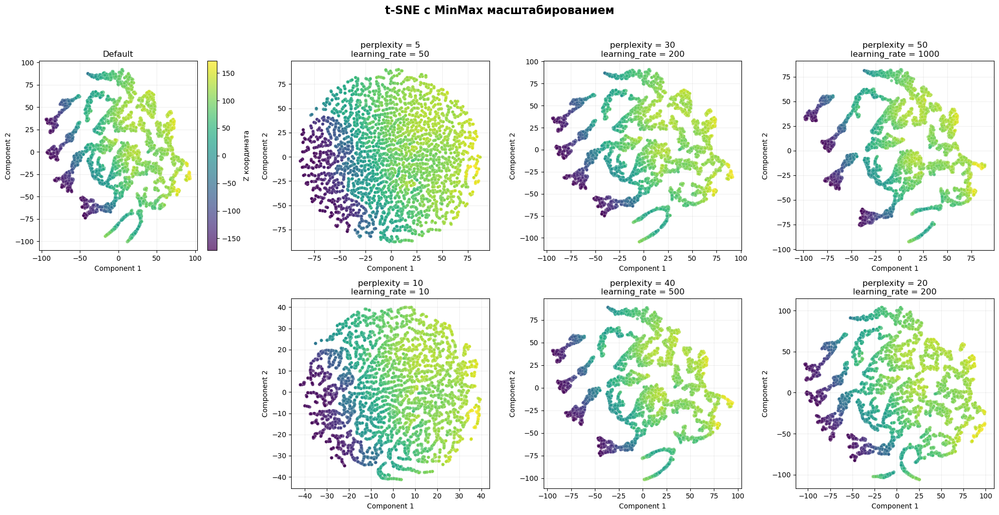

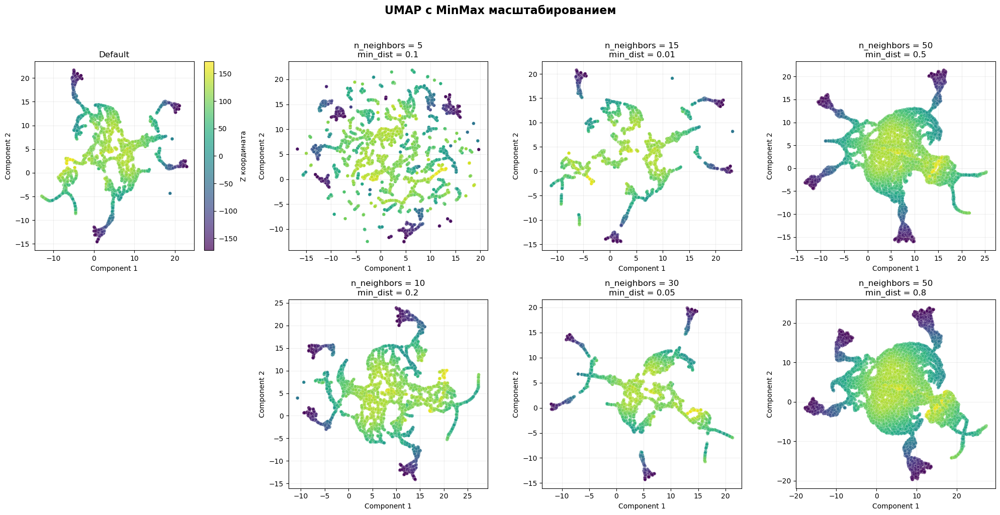

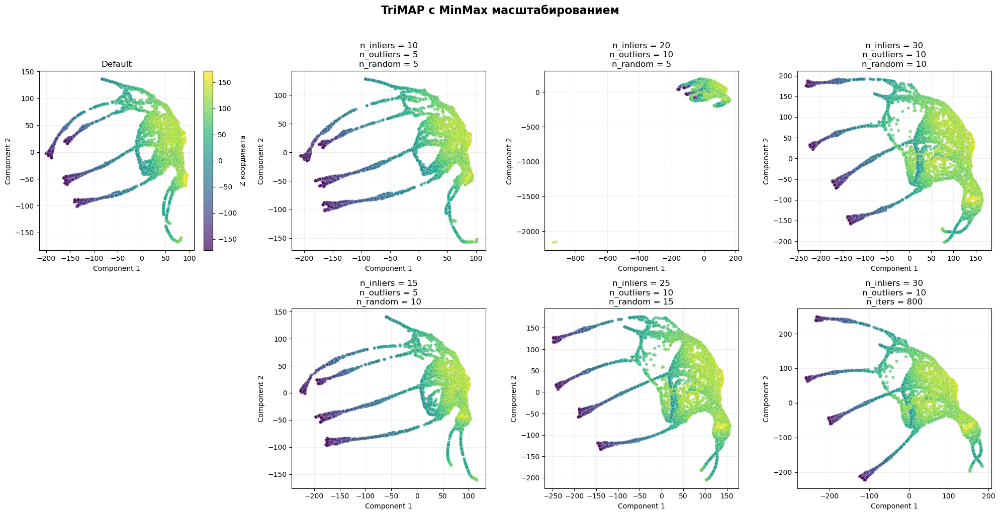

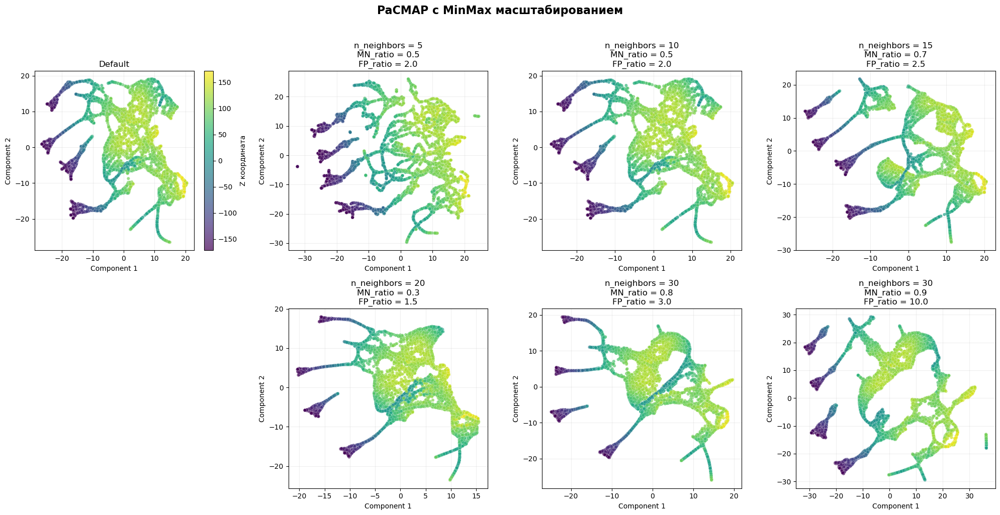

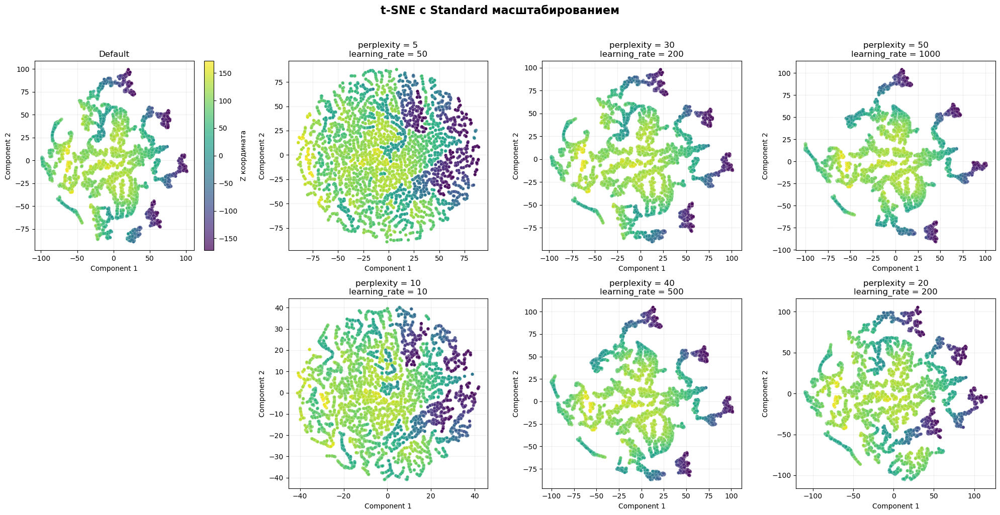

...

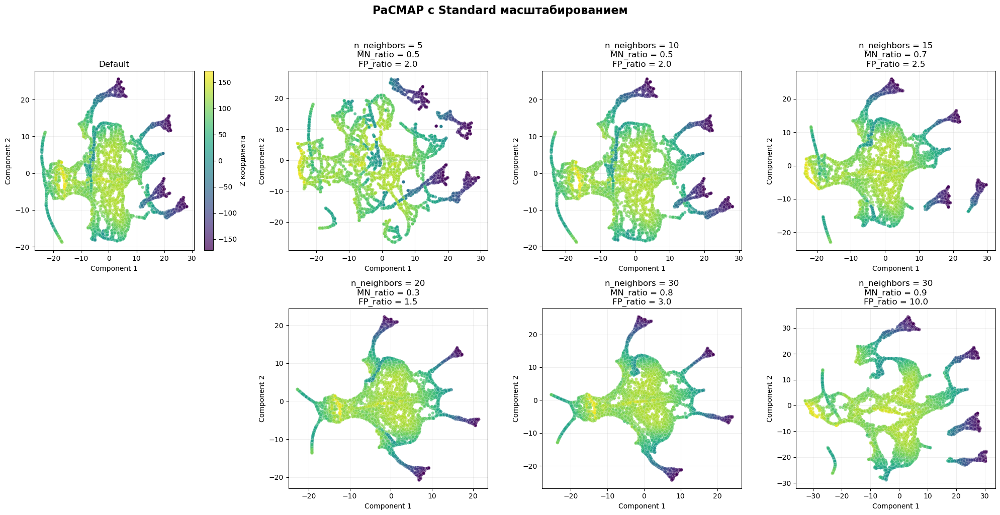

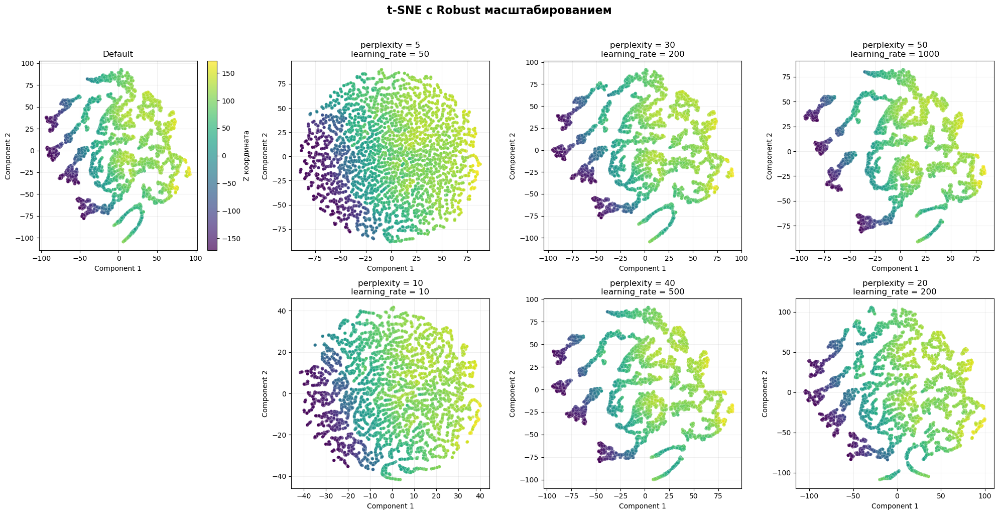

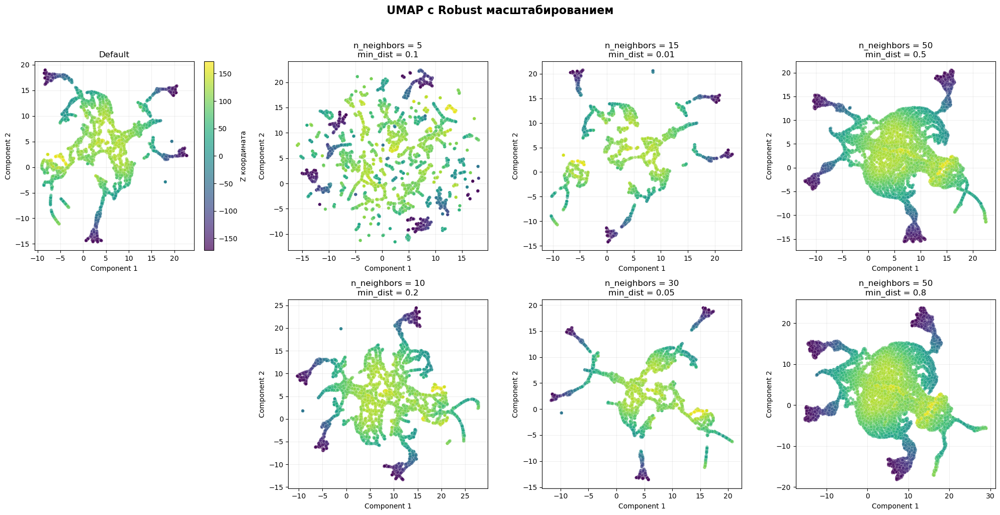

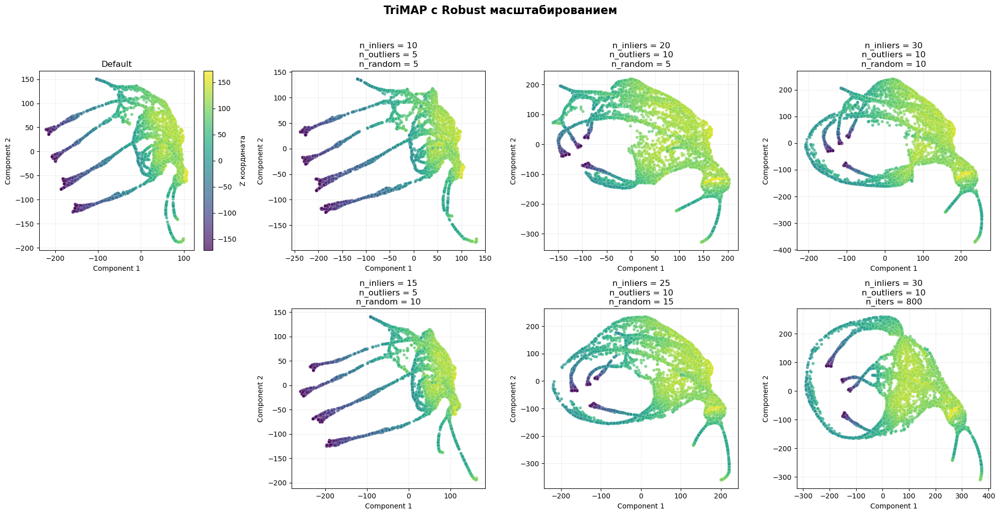

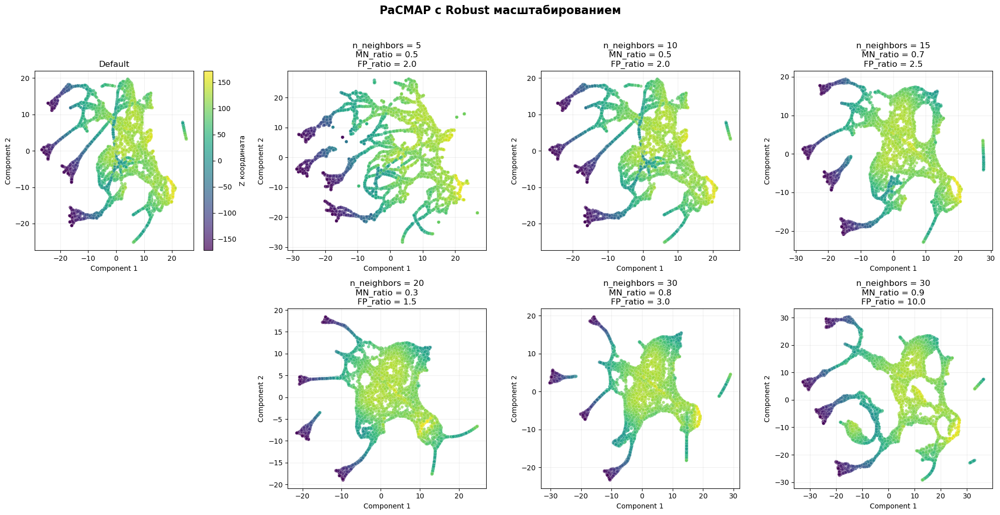

In [29]:
mammoth_color = {
    'name': 'z',
    'label': 'Z координата'
}

visualize_all(mammoth_results, mammoth_color)

In [31]:
mammoth_stats = analyze_results(mammoth_results, 
                                mammoth_data[['x', 'y', 'z']])


ТОП-10 КОМБИНАЦИЙ ПО КОРРЕЛЯЦИИ РАССТОЯНИЙ
Алгоритм Масштабирование Параметры  Корреляция расстояний  Stress метрика  Количество точек
    UMAP        Standard  params_1                 0.0081          0.9374             10000
  PaCMAP        Standard  params_1                 0.0068          0.9003             10000
  PaCMAP          Robust  params_6                 0.0051          0.8816             10000
    UMAP          Robust  params_6                 0.0050          0.9308             10000
  PaCMAP          Robust   default                 0.0049          0.9106             10000
  PaCMAP          Robust  params_2                 0.0049          0.9106             10000
  TriMAP          MinMax   default                 0.0049          0.8596             10000
   t-SNE        Standard  params_1                 0.0047          0.7738             10000
  PaCMAP          MinMax   default                 0.0046          0.9089             10000
  PaCMAP          MinMax  params_2  